In [11]:
import numpy as np
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [8.0,8.0]
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
from FocalSpot import focal_spot


In [12]:
# Spatial Calibration from grating
def spatial_cal_with_grating():
    """
    Spatial calibration
    
    17.5 cm with 25 slits
    d = 0.007 m
        eq:
            d \sin \theta_{m} = m\lambda
    
    np.deg2rad(np.arcsin( (1 * lambda_l) / d ))        
    """
    d = 0.007
    fl = 1
    lambda_l = 800e-9
    Space_of_diffraction_peaks = lambda_l * fl / d
    return (Space_of_diffraction_peaks)

In [13]:
peakSpacing = spatial_cal_with_grating()
print ("Predicted spacing of spots")
print (peakSpacing)

# Positions of the spots from the image, extracted with ImageJ
yPos = np.array([55.97, 170.83, 290])
xPos = np.array([34.12, 147.83, 260.47])
yGap = yPos[1:] - yPos[:-1]
xGap = xPos[1:] - xPos[:-1]

aveSpace = [np.average(yGap), np.average( xGap)]
print ("Measured spacing in pixesl")
print (aveSpace )
print ()

Predicted spacing of spots
0.00011428571428571428
Measured spacing in pixesl
[117.015, 113.17500000000001]



In [14]:
pixelSize = peakSpacing /  np.average(aveSpace)
print ("m_per_pixel ", pixelSize)


m_per_pixel  9.929685415153941e-07


In [15]:
folderPath = "/home/chris/Documents/Streeter/Data/FocalSpots_4-9-19/"

laserShots = "PulsedFocus/"
backgroundShots = "bkg/"

In [16]:
import os
def FilesInFolder(DirectoryPath, fileType, starts = ""):
    files = os.listdir(DirectoryPath)
    shots = []
    for i in files:
#        print( i
        if not i.startswith('.') and i.endswith(fileType) and i.startswith(starts):
            shots.append(i)
    return shots

Background File:  Shot_0233.tiff


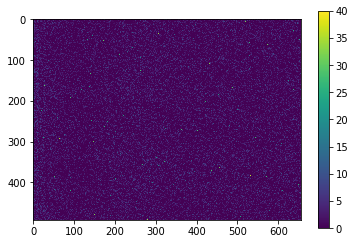

Background File:  Shot_0301.tiff


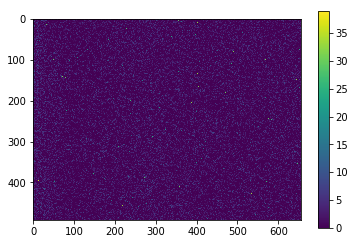

Background File:  Shot_0253.tiff


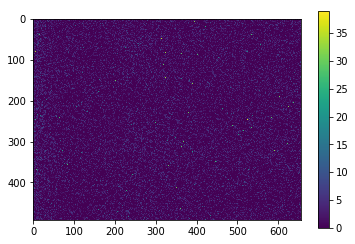

Background File:  Shot_0238.tiff


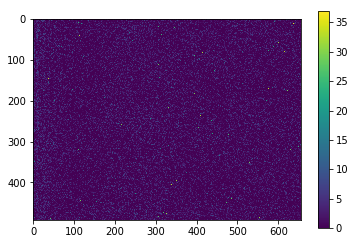

Background File:  Shot_0308.tiff


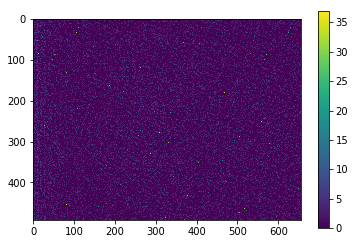

Background File:  Shot_0240.tiff


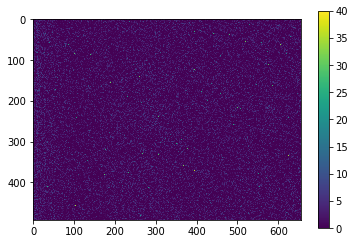

Background File:  Shot_0324.tiff


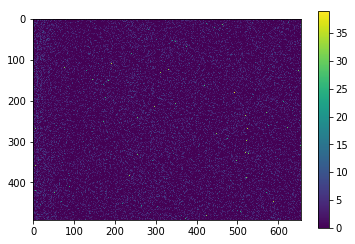

Background File:  Shot_0234.tiff


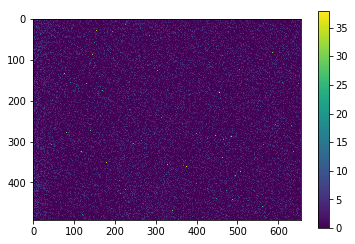

Background File:  Shot_0252.tiff


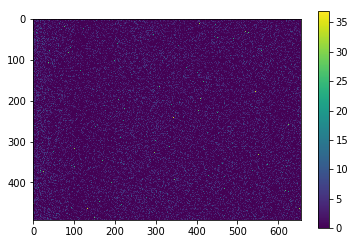

Background File:  Shot_0293.tiff


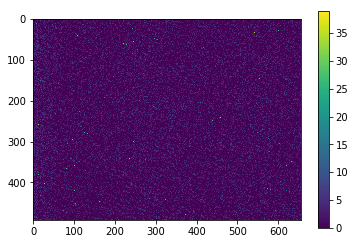

Background File:  Shot_0283.tiff


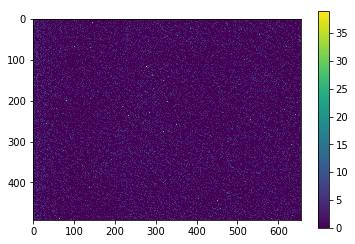

Background File:  Shot_0319.tiff


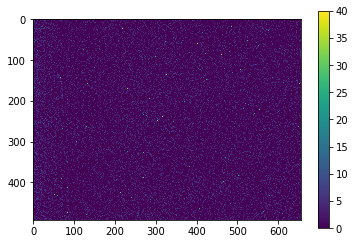

Background File:  Shot_0288.tiff


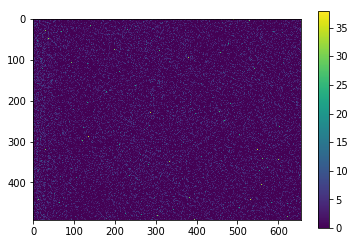

Background File:  Shot_0259.tiff


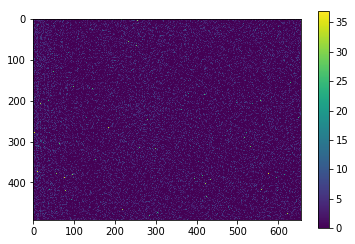

Background File:  Shot_0322.tiff


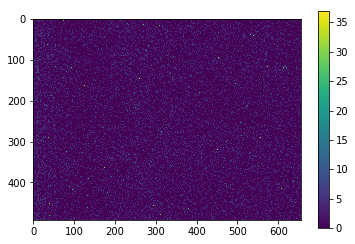

Background File:  Shot_0281.tiff


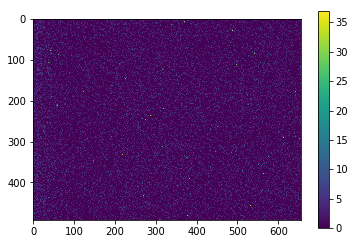

Background File:  Shot_0289.tiff


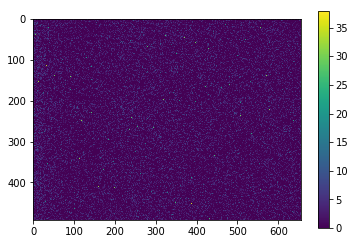

Background File:  Shot_0284.tiff


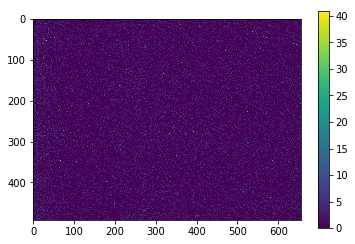

Background File:  Shot_0239.tiff


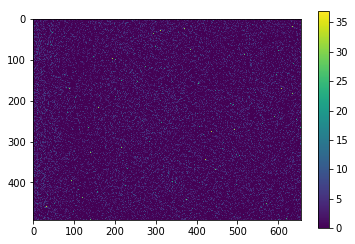

Background File:  Shot_0250.tiff


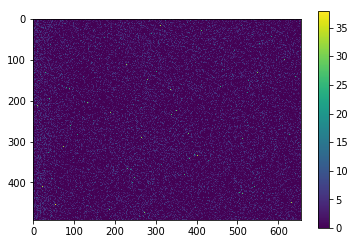

Background File:  Shot_0285.tiff


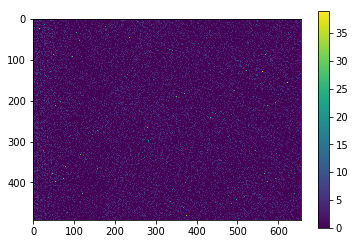

Background File:  Shot_0296.tiff


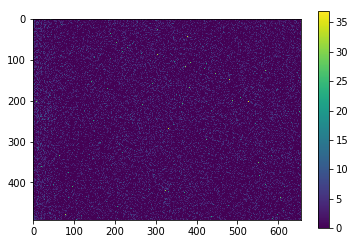

Background File:  Shot_0247.tiff


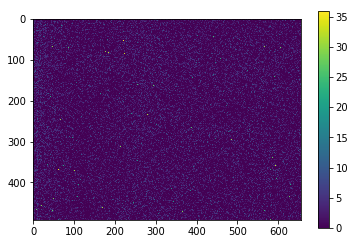

Background File:  Shot_0286.tiff


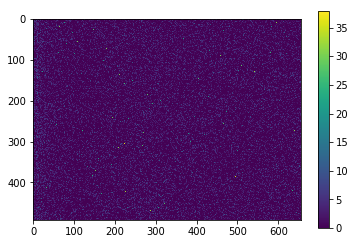

Background File:  Shot_0271.tiff


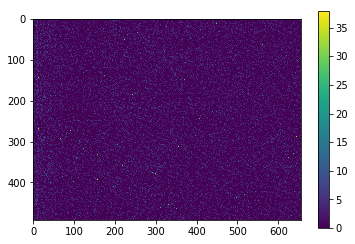

Background File:  Shot_0290.tiff


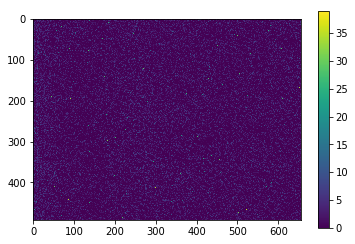

Background File:  Shot_0255.tiff


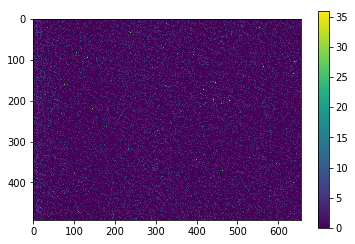

Background File:  Shot_0231.tiff


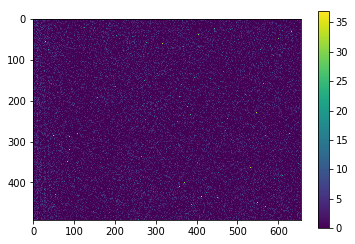

Background File:  Shot_0309.tiff


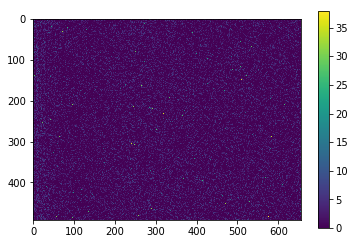

Background File:  Shot_0315.tiff


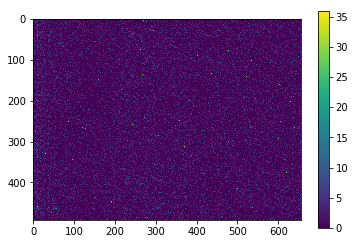

Background File:  Shot_0273.tiff


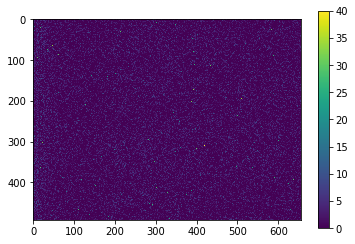

Background File:  Shot_0246.tiff


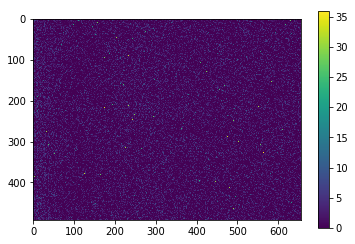

Background File:  Shot_0279.tiff


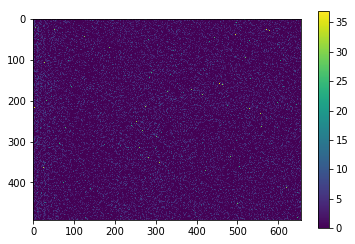

Background File:  Shot_0268.tiff


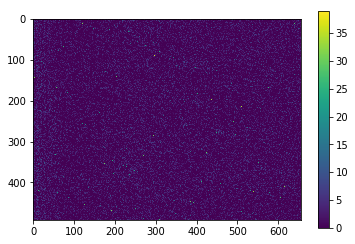

Background File:  Shot_0317.tiff


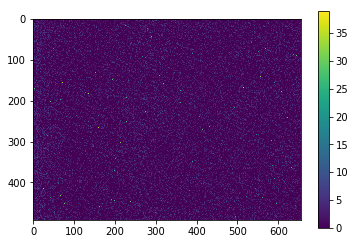

Background File:  Shot_0316.tiff


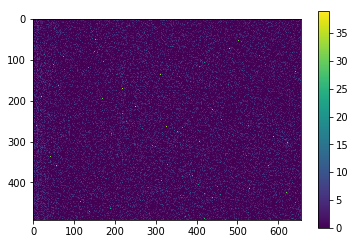

Background File:  Shot_0307.tiff


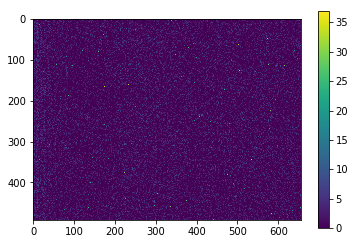

Background File:  Shot_0310.tiff


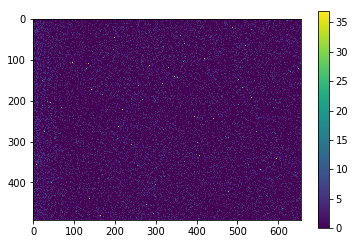

Background File:  Shot_0262.tiff


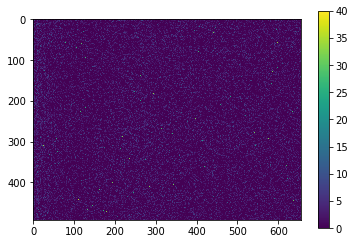

Background File:  Shot_0264.tiff


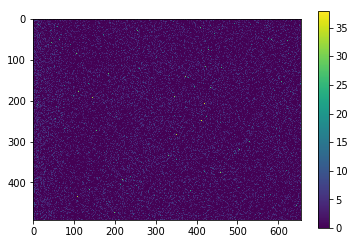

Background File:  Shot_0266.tiff


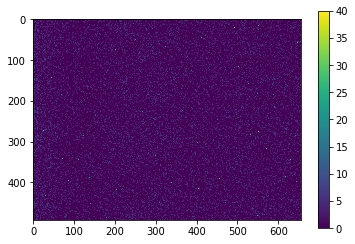

Background File:  Shot_0277.tiff


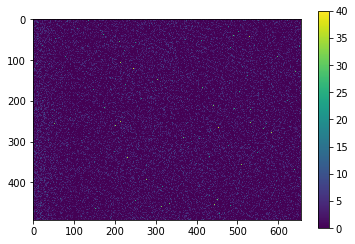

Background File:  Shot_0311.tiff


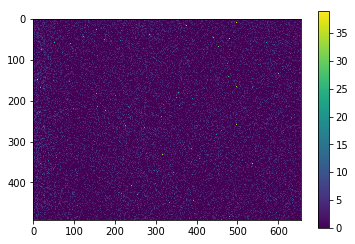

Background File:  Shot_0249.tiff


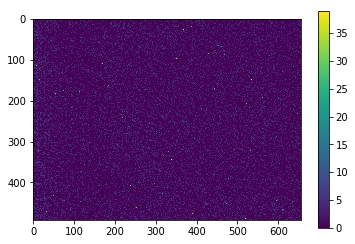

Background File:  Shot_0295.tiff


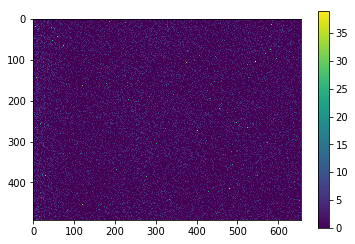

Background File:  Shot_0280.tiff


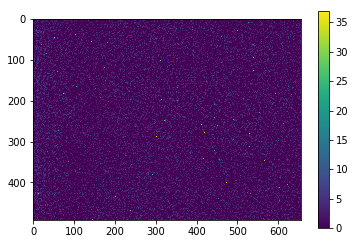

Background File:  Shot_0257.tiff


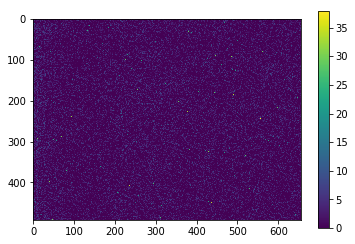

Background File:  Shot_0287.tiff


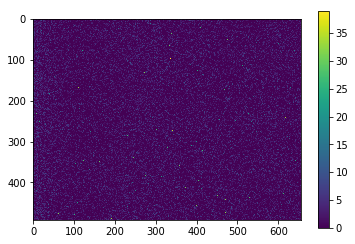

Background File:  Shot_0232.tiff


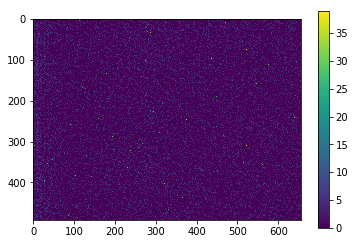

Background File:  Shot_0305.tiff


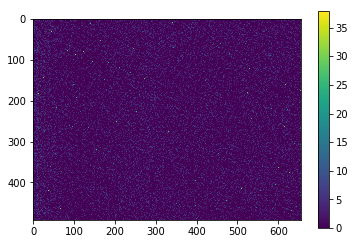

Background File:  Shot_0260.tiff


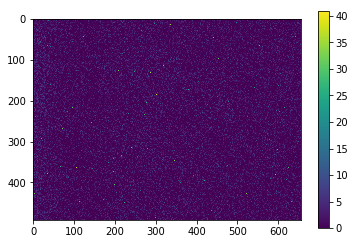

Background File:  Shot_0306.tiff


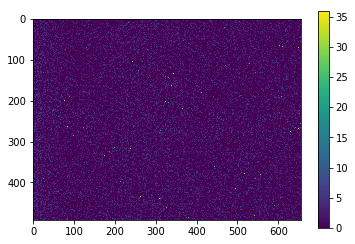

Background File:  Shot_0303.tiff


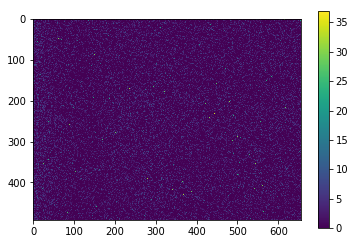

Background File:  Shot_0321.tiff


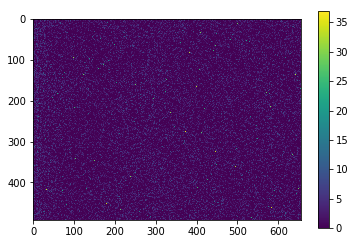

Background File:  Shot_0304.tiff


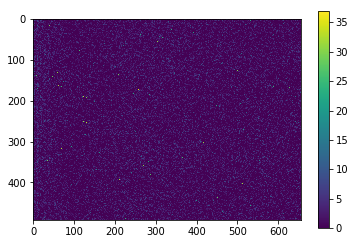

Background File:  Shot_0312.tiff


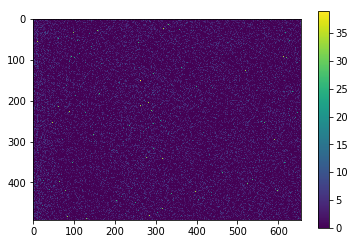

Background File:  Shot_0299.tiff


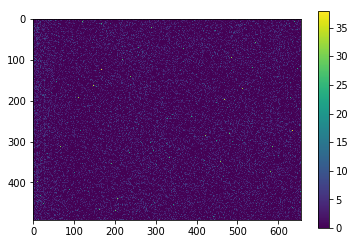

Background File:  Shot_0300.tiff


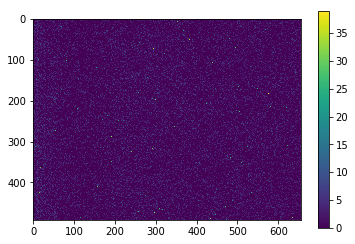

Background File:  Shot_0237.tiff


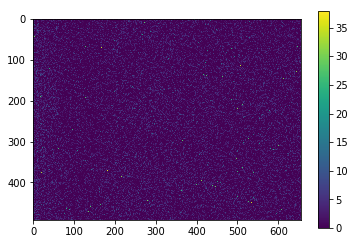

Background File:  Shot_0241.tiff


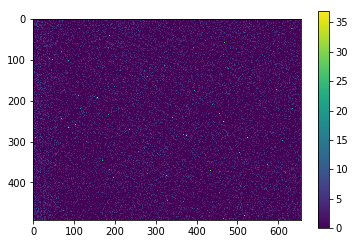

Background File:  Shot_0314.tiff


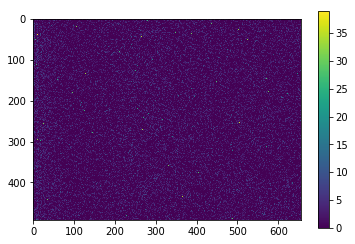

Background File:  Shot_0272.tiff


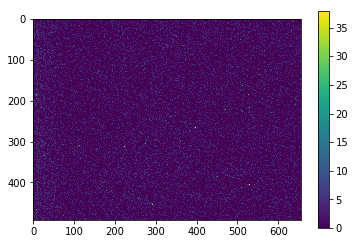

Background File:  Shot_0318.tiff


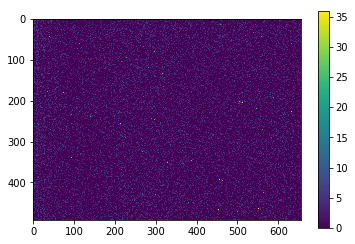

Background File:  Shot_0243.tiff


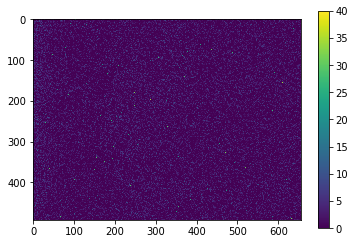

Background File:  Shot_0265.tiff


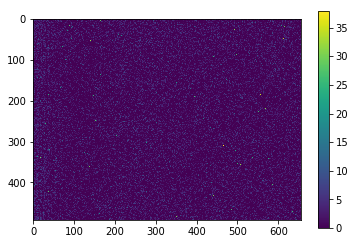

Background File:  Shot_0292.tiff


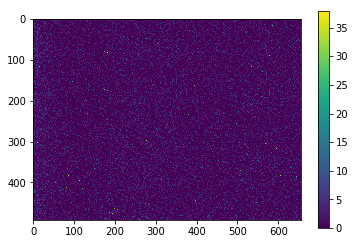

Background File:  Shot_0294.tiff


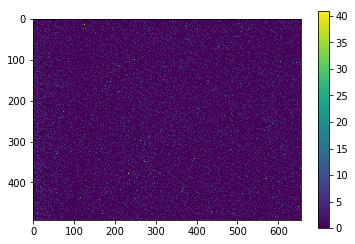

Background File:  Shot_0297.tiff


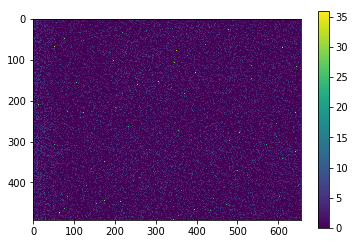

Background File:  Shot_0235.tiff


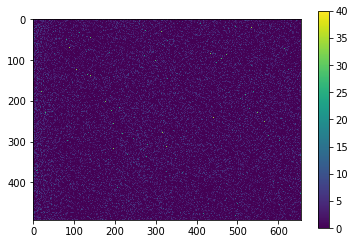

Background File:  Shot_0323.tiff


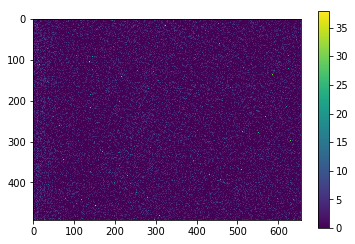

Background File:  Shot_0258.tiff


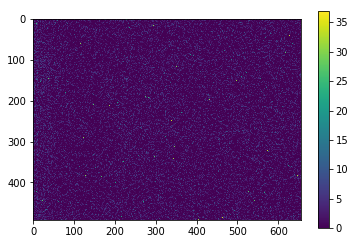

Background File:  Shot_0242.tiff


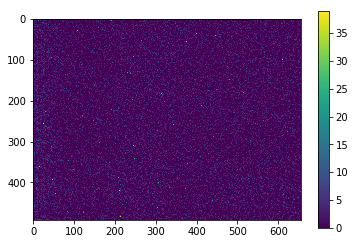

Background File:  Shot_0291.tiff


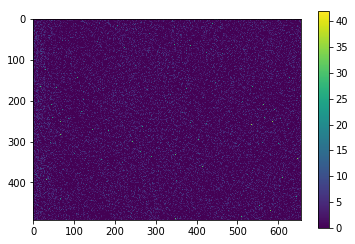

Background File:  Shot_0267.tiff


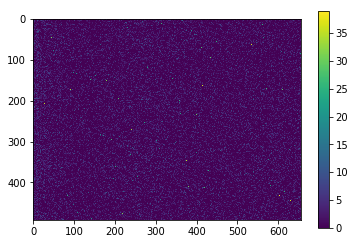

Background File:  Shot_0270.tiff


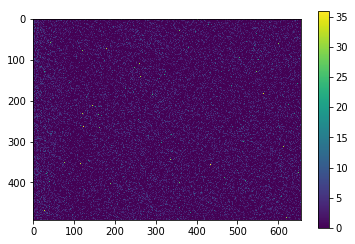

Background File:  Shot_0274.tiff


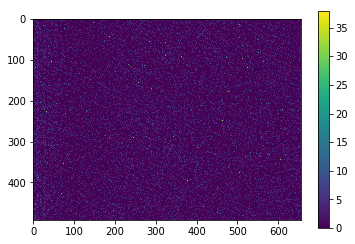

Background File:  Shot_0282.tiff


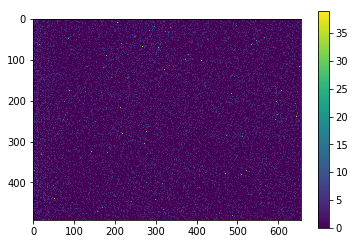

Background File:  Shot_0245.tiff


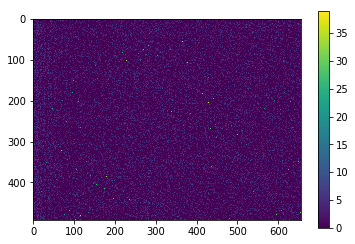

Background File:  Shot_0278.tiff


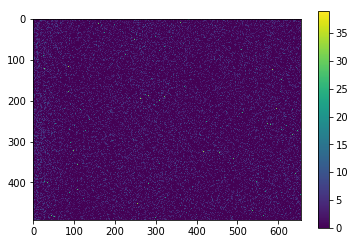

Background File:  Shot_0276.tiff


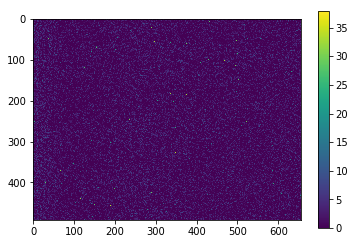

Background File:  Shot_0269.tiff


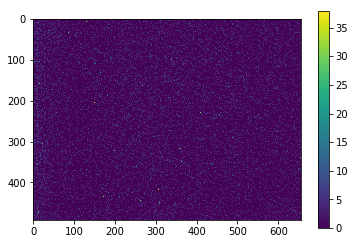

Background File:  Shot_0320.tiff


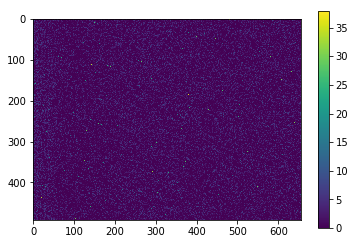

Background File:  Shot_0251.tiff


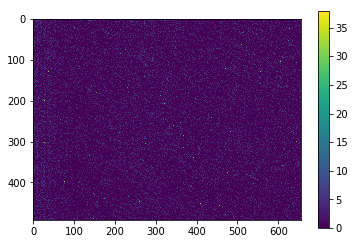

Background File:  Shot_0254.tiff


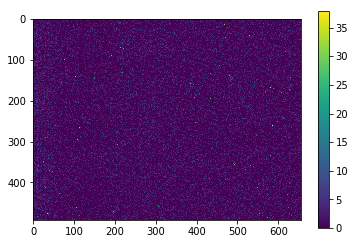

Background File:  Shot_0236.tiff


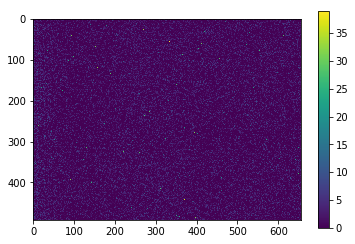

Background File:  Shot_0302.tiff


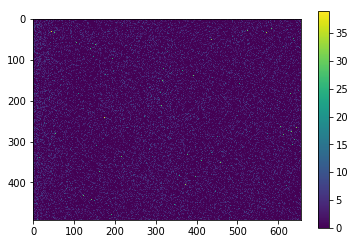

Background File:  Shot_0261.tiff


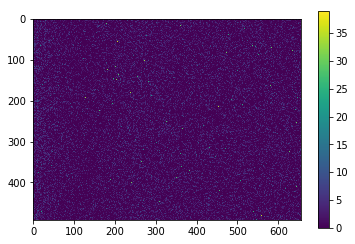

Background File:  Shot_0313.tiff


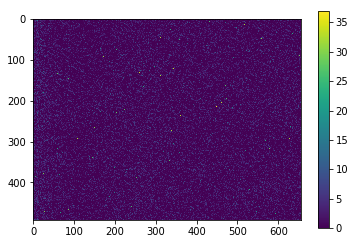

Background File:  Shot_0298.tiff


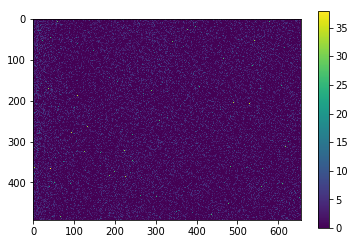

Background File:  Shot_0248.tiff


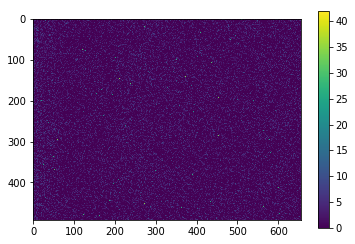

Background File:  Shot_0244.tiff


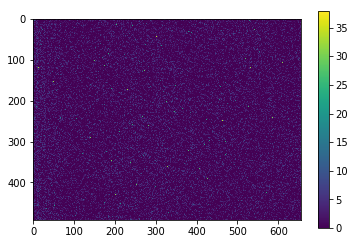

Background File:  Shot_0256.tiff


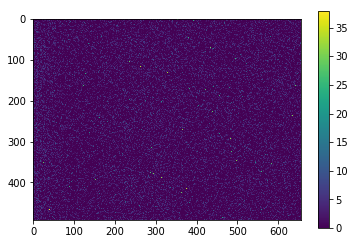

Background File:  Shot_0263.tiff


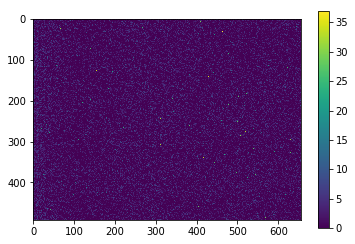

Background File:  Shot_0275.tiff


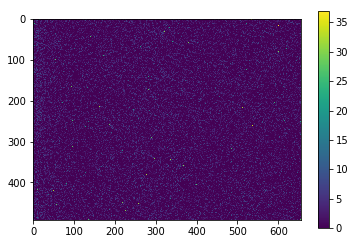

In [18]:
laserFiles = FilesInFolder(folderPath + laserShots, ".tiff")
backgroundFiles = FilesInFolder(folderPath + backgroundShots, ".tiff")

background_sums = []
for i, b in enumerate(backgroundFiles):
    print ("Background File: ", b)
    im = np.array(Image.open(folderPath + backgroundShots + b))
    fs = focal_spot(im, calculations = False)    
    background_sums.append(fs.return_energy())
    if i == 0:
        background_aveImage = fs.im
    else:
        background_aveImage += fs.im
background_aveImage = background_aveImage / (i+1)


Laser file:  Shot_0174.tiff
Maximum Coordinate (pixel nos):  [325, 265]


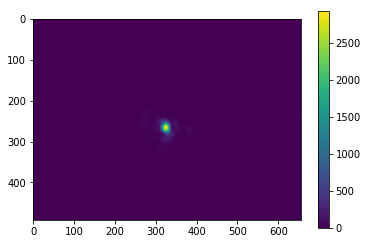

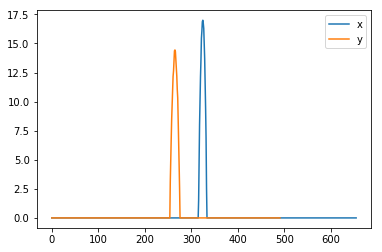

Laser file:  Shot_0186.tiff
Maximum Coordinate (pixel nos):  [329, 270]


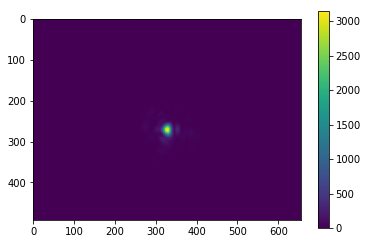

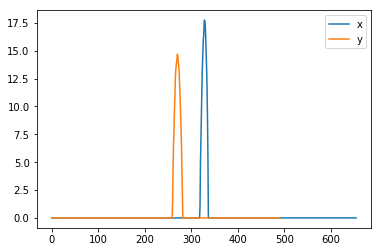

Laser file:  Shot_0227.tiff
Maximum Coordinate (pixel nos):  [324, 266]


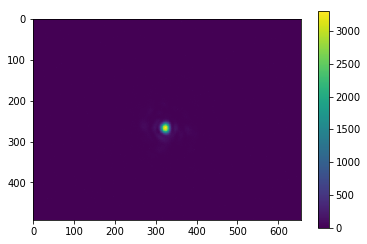

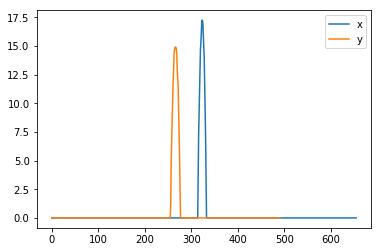

Laser file:  Shot_0180.tiff
Maximum Coordinate (pixel nos):  [323, 268]


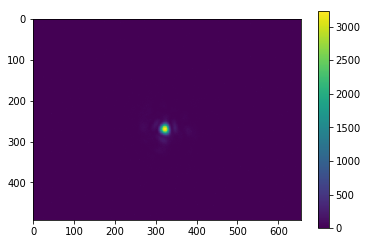

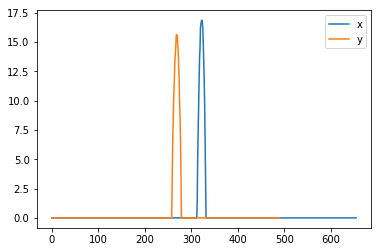

Laser file:  Shot_0165.tiff
Maximum Coordinate (pixel nos):  [326, 266]


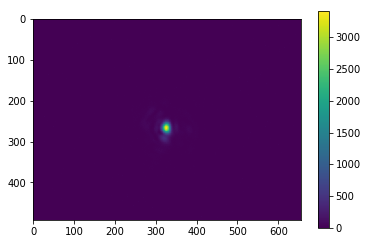

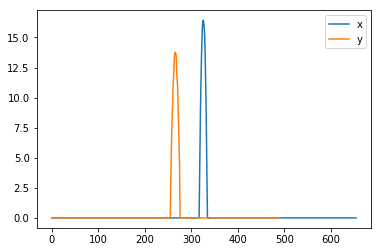

Laser file:  Shot_0188.tiff
Maximum Coordinate (pixel nos):  [319, 269]


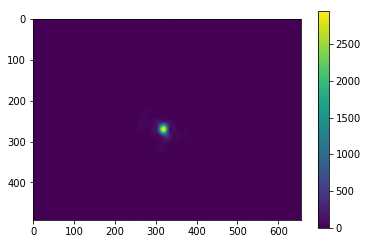

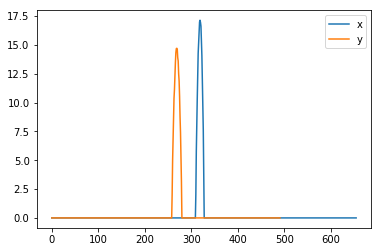

Laser file:  Shot_0214.tiff
Maximum Coordinate (pixel nos):  [330, 268]


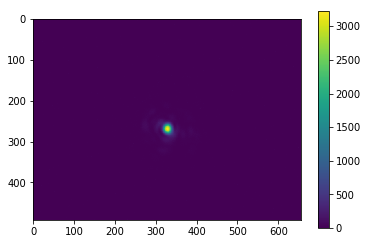

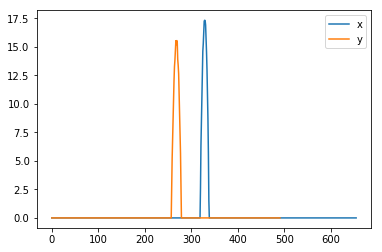

Laser file:  Shot_0181.tiff
Maximum Coordinate (pixel nos):  [323, 266]


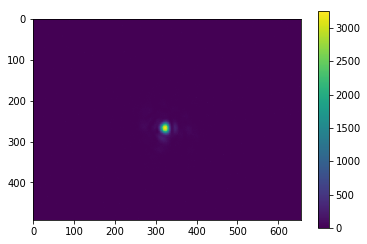

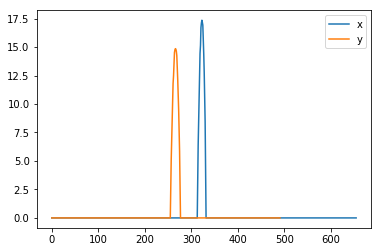

Laser file:  Shot_0221.tiff
Maximum Coordinate (pixel nos):  [328, 263]


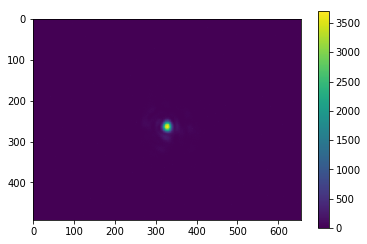

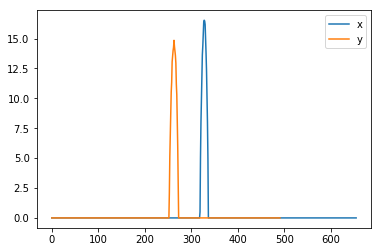

Laser file:  Shot_0216.tiff
Maximum Coordinate (pixel nos):  [330, 265]


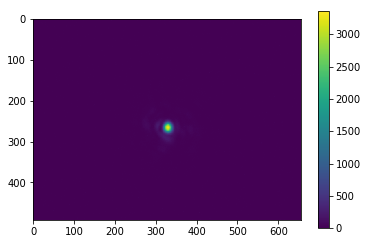

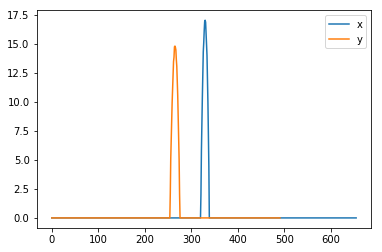

Laser file:  Shot_0182.tiff
Maximum Coordinate (pixel nos):  [323, 266]


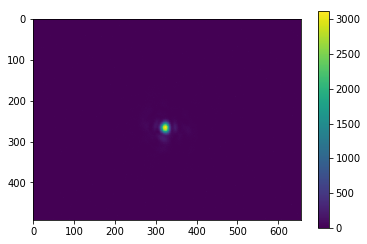

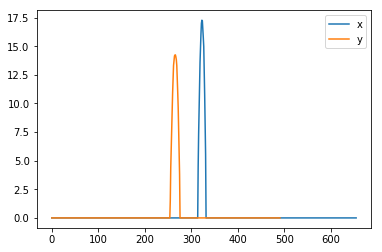

Laser file:  Shot_0187.tiff
Maximum Coordinate (pixel nos):  [331, 270]


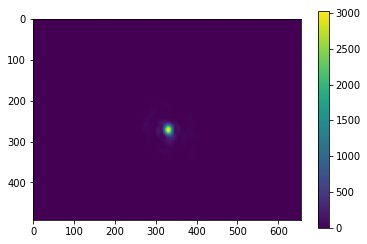

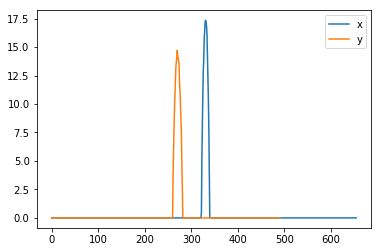

Laser file:  Shot_0215.tiff
Maximum Coordinate (pixel nos):  [336, 268]


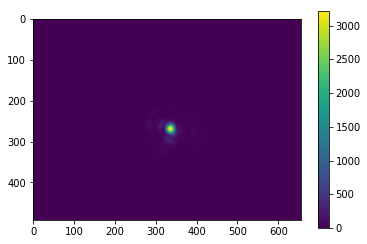

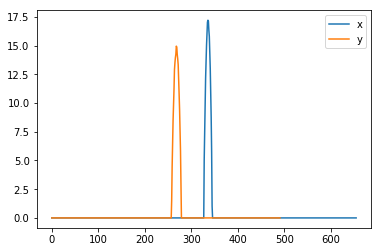

Laser file:  Shot_0172.tiff
Maximum Coordinate (pixel nos):  [330, 268]


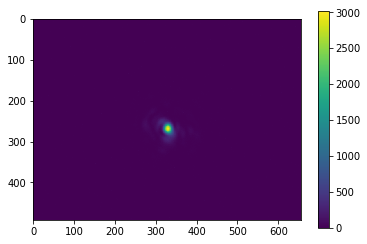

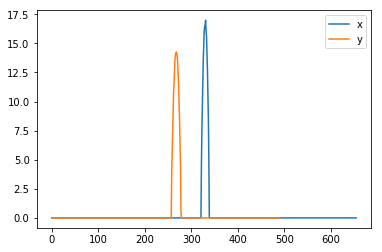

Laser file:  Shot_0189.tiff
Maximum Coordinate (pixel nos):  [326, 267]


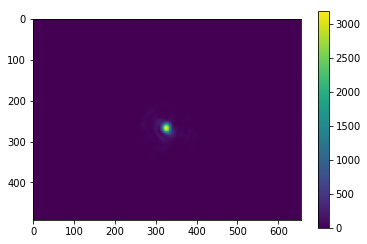

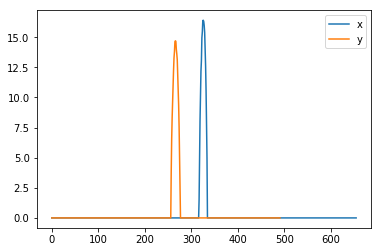

Laser file:  Shot_0173.tiff
Maximum Coordinate (pixel nos):  [328, 264]


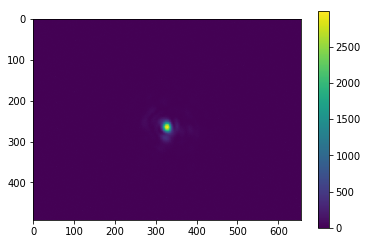

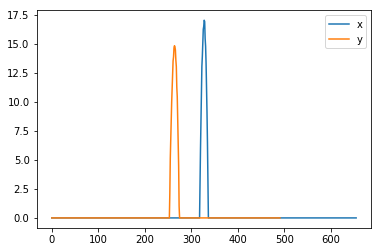

Laser file:  Shot_0200.tiff
Maximum Coordinate (pixel nos):  [326, 269]


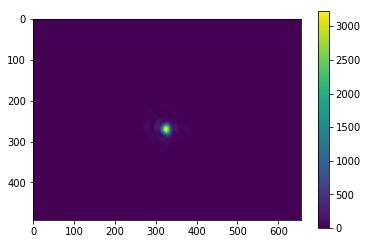

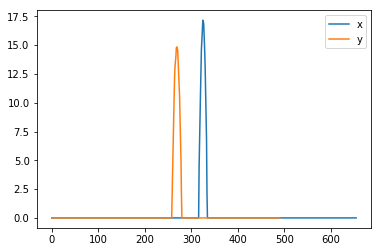

Laser file:  Shot_0183.tiff
Maximum Coordinate (pixel nos):  [325, 268]


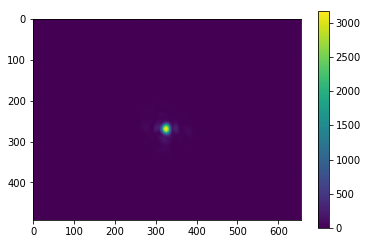

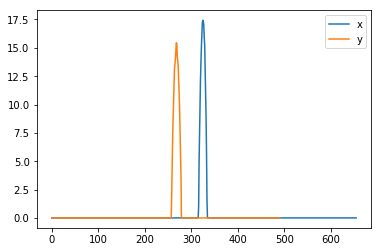

Laser file:  Shot_0199.tiff
Maximum Coordinate (pixel nos):  [334, 264]


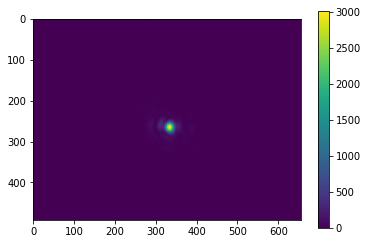

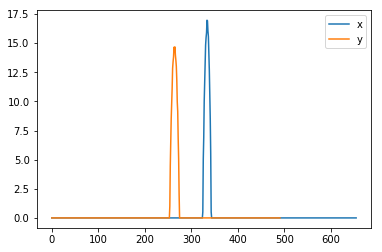

Laser file:  Shot_0198.tiff
Maximum Coordinate (pixel nos):  [327, 262]


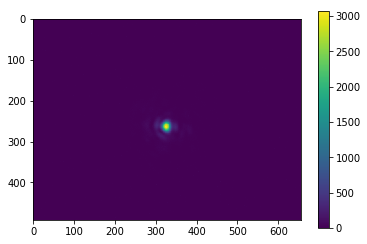

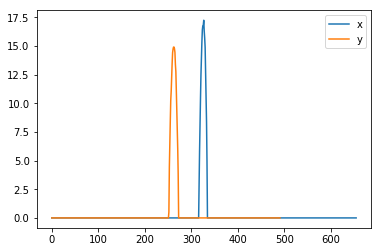

Laser file:  Shot_0177.tiff
Maximum Coordinate (pixel nos):  [326, 261]


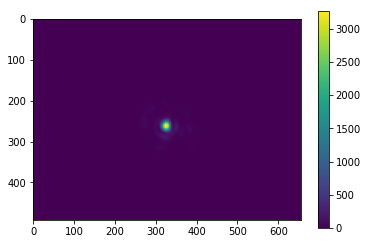

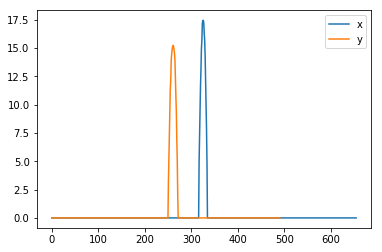

Laser file:  Shot_0170.tiff
Maximum Coordinate (pixel nos):  [324, 263]


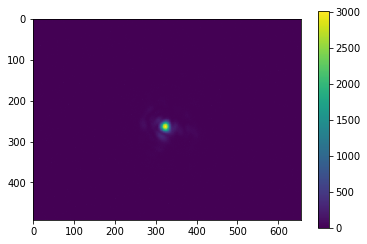

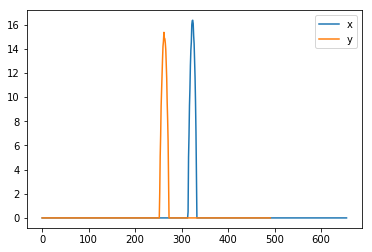

Laser file:  Shot_0192.tiff
Maximum Coordinate (pixel nos):  [324, 265]


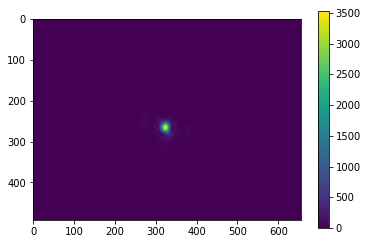

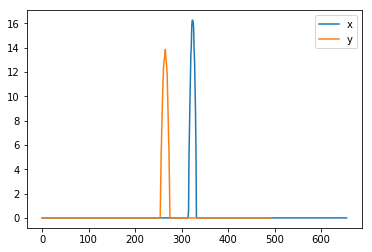

Laser file:  Shot_0211.tiff
Maximum Coordinate (pixel nos):  [331, 269]


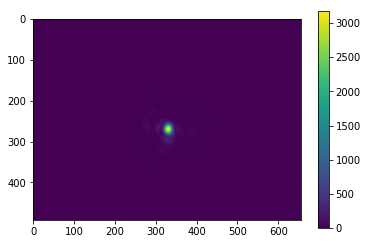

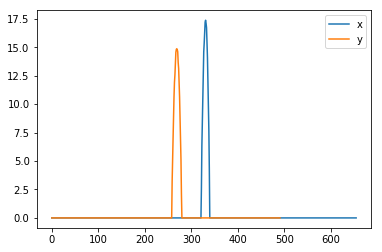

Laser file:  Shot_0203.tiff
Maximum Coordinate (pixel nos):  [330, 262]


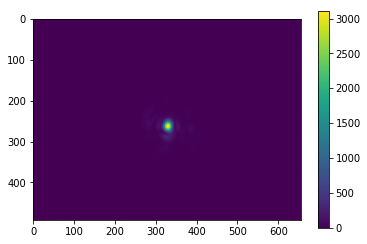

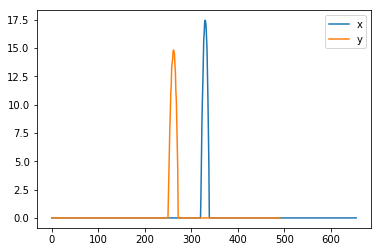

Laser file:  Shot_0179.tiff
Maximum Coordinate (pixel nos):  [325, 266]


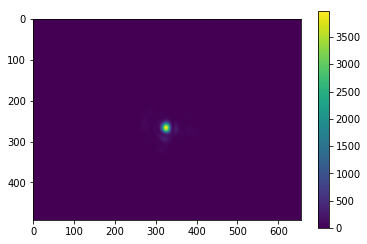

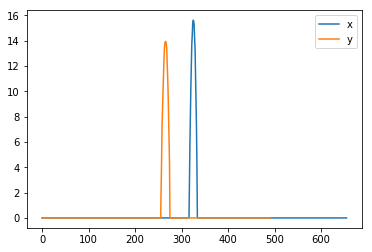

Laser file:  Shot_0226.tiff
Maximum Coordinate (pixel nos):  [327, 264]


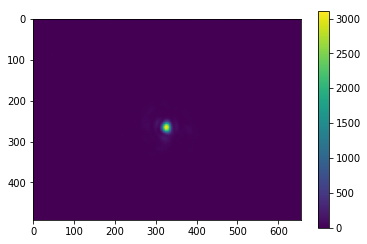

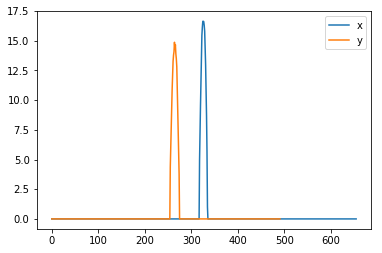

Laser file:  Shot_0185.tiff
Maximum Coordinate (pixel nos):  [328, 272]


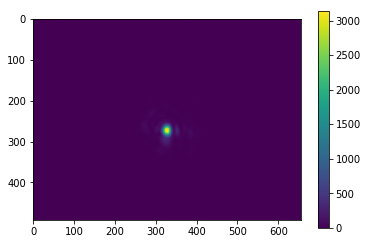

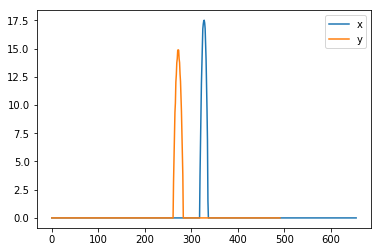

Laser file:  Shot_0168.tiff
Maximum Coordinate (pixel nos):  [334, 269]


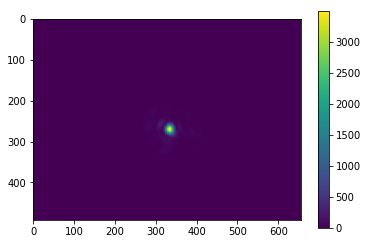

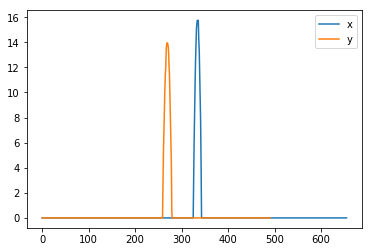

Laser file:  Shot_0222.tiff
Maximum Coordinate (pixel nos):  [329, 263]


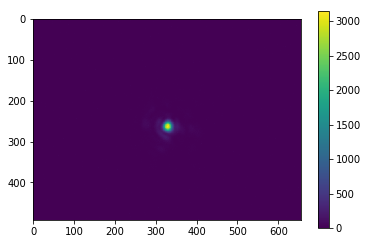

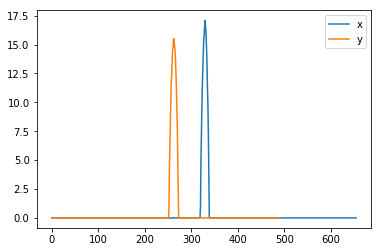

Laser file:  Shot_0207.tiff
Maximum Coordinate (pixel nos):  [330, 265]


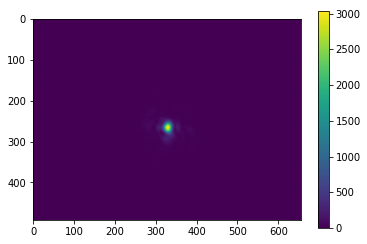

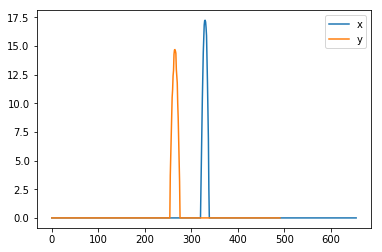

Laser file:  Shot_0225.tiff
Maximum Coordinate (pixel nos):  [328, 269]


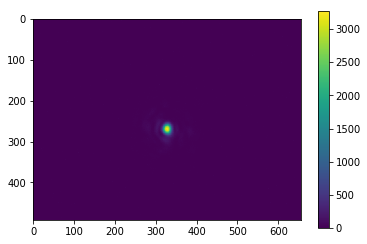

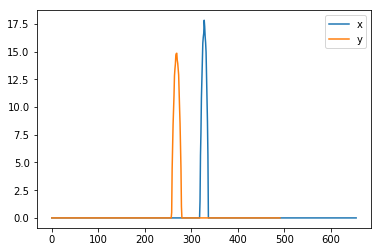

Laser file:  Shot_0218.tiff
Maximum Coordinate (pixel nos):  [329, 268]


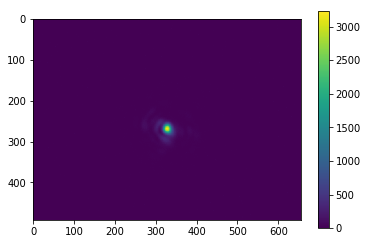

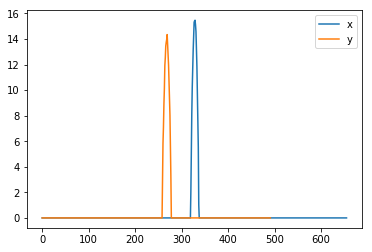

Laser file:  Shot_0171.tiff
Maximum Coordinate (pixel nos):  [320, 264]


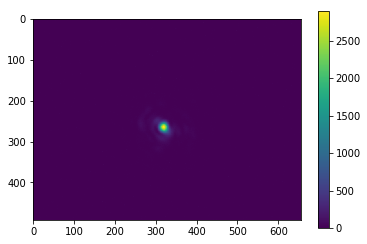

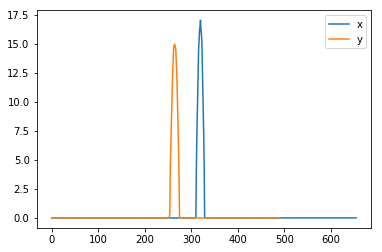

Laser file:  Shot_0169.tiff
Maximum Coordinate (pixel nos):  [329, 272]


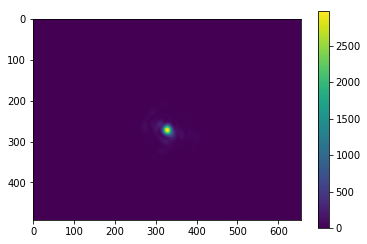

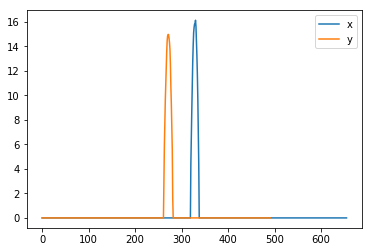

Laser file:  Shot_0190.tiff
Maximum Coordinate (pixel nos):  [322, 266]


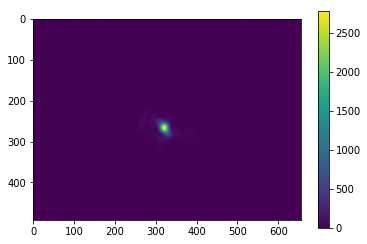

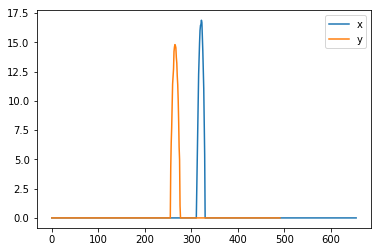

Laser file:  Shot_0178.tiff
Maximum Coordinate (pixel nos):  [322, 265]


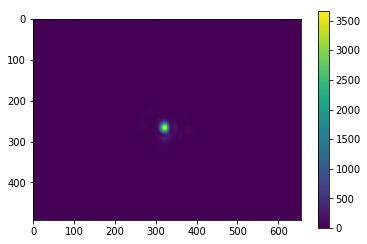

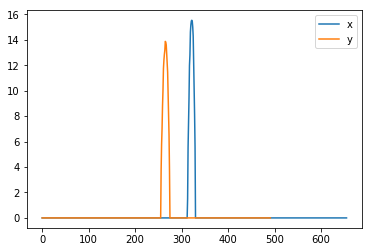

Laser file:  Shot_0195.tiff
Maximum Coordinate (pixel nos):  [324, 264]


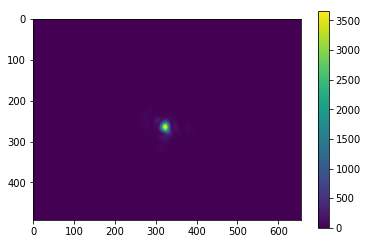

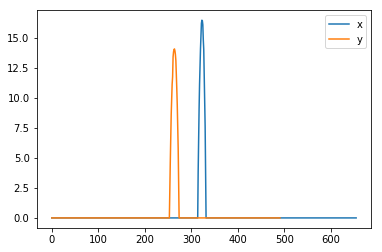

Laser file:  Shot_0208.tiff
Maximum Coordinate (pixel nos):  [328, 264]


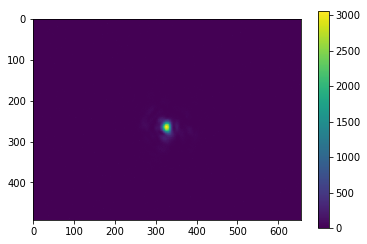

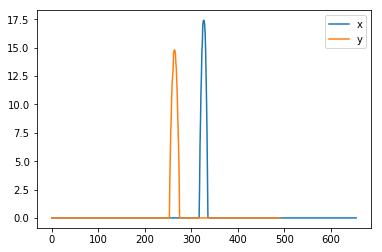

Laser file:  Shot_0167.tiff
Maximum Coordinate (pixel nos):  [325, 267]


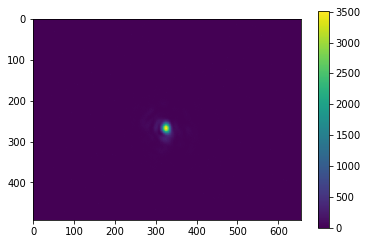

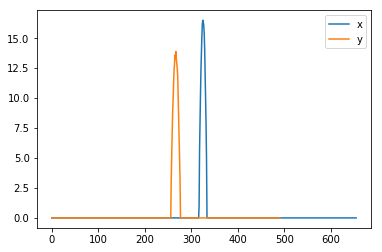

Laser file:  Shot_0230.tiff
Maximum Coordinate (pixel nos):  [322, 263]


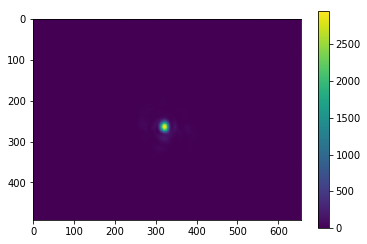

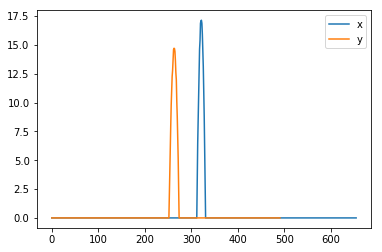

Laser file:  Shot_0202.tiff
Maximum Coordinate (pixel nos):  [322, 262]


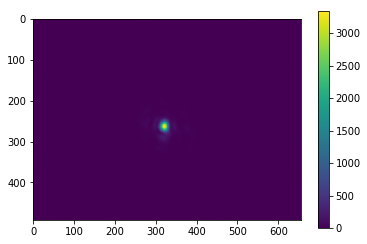

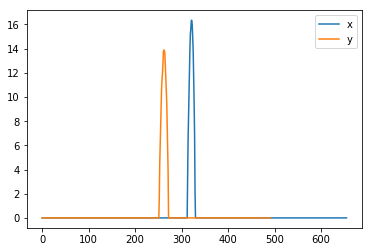

Laser file:  Shot_0205.tiff
Maximum Coordinate (pixel nos):  [333, 265]


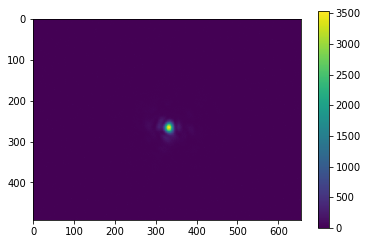

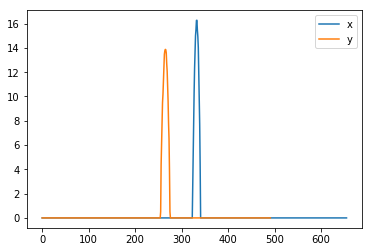

Laser file:  Shot_0201.tiff
Maximum Coordinate (pixel nos):  [331, 263]


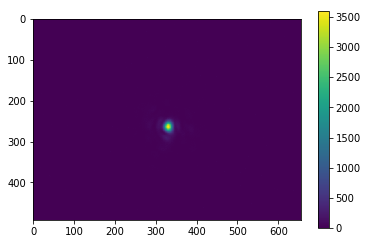

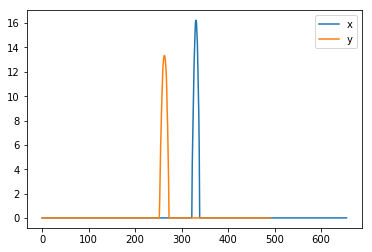

Laser file:  Shot_0184.tiff
Maximum Coordinate (pixel nos):  [327, 271]


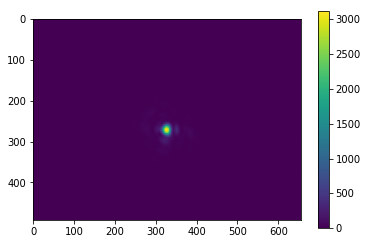

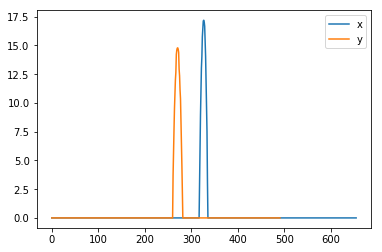

Laser file:  Shot_0166.tiff
Maximum Coordinate (pixel nos):  [329, 268]


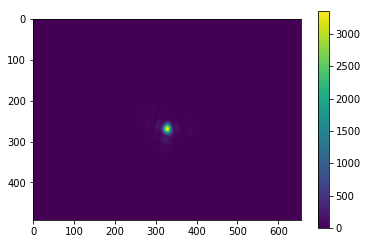

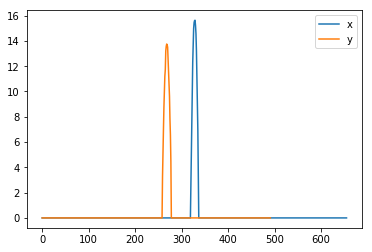

Laser file:  Shot_0175.tiff
Maximum Coordinate (pixel nos):  [325, 266]


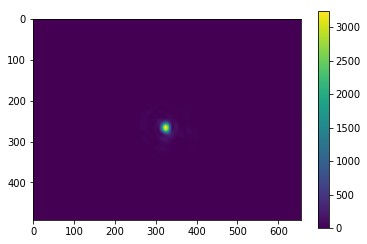

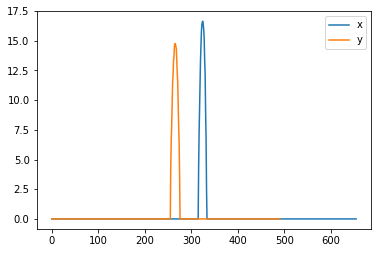

Laser file:  Shot_0229.tiff
Maximum Coordinate (pixel nos):  [322, 268]


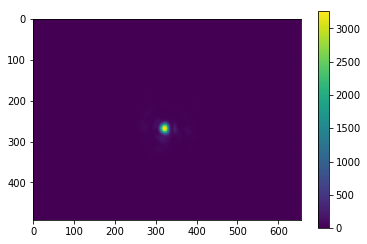

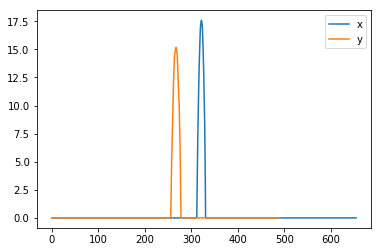

Laser file:  Shot_0213.tiff
Maximum Coordinate (pixel nos):  [331, 267]


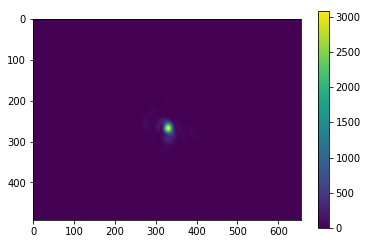

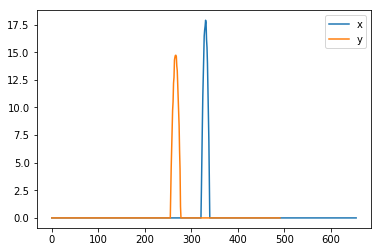

Laser file:  Shot_0223.tiff
Maximum Coordinate (pixel nos):  [325, 266]


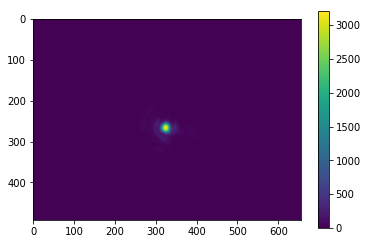

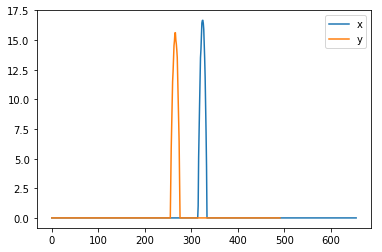

Laser file:  Shot_0176.tiff
Maximum Coordinate (pixel nos):  [324, 263]


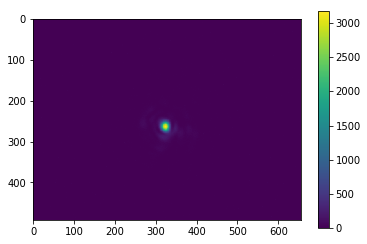

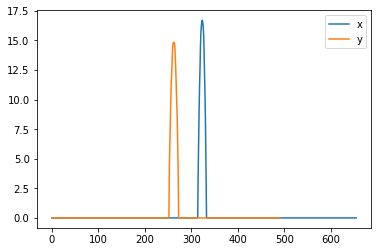

Laser file:  Shot_0210.tiff
Maximum Coordinate (pixel nos):  [327, 265]


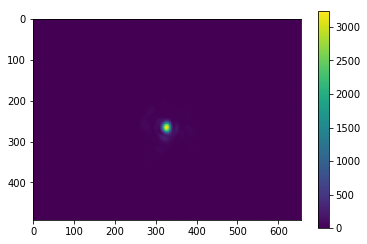

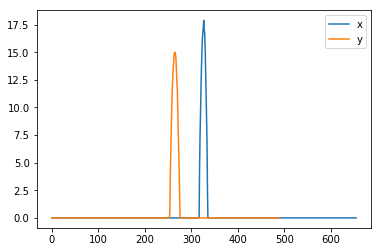

Laser file:  Shot_0197.tiff
Maximum Coordinate (pixel nos):  [328, 263]


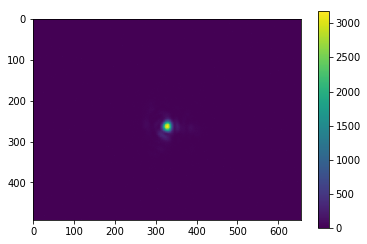

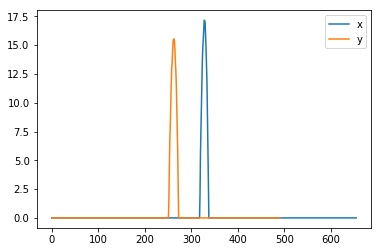

Laser file:  Shot_0206.tiff
Maximum Coordinate (pixel nos):  [323, 263]


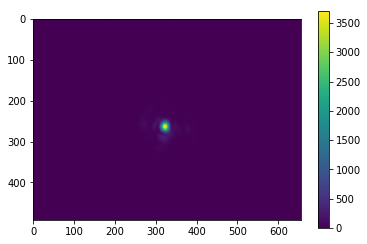

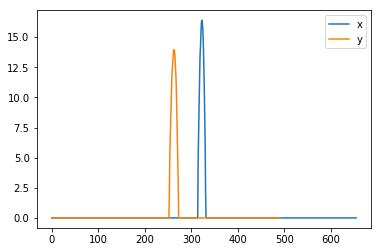

Laser file:  Shot_0191.tiff
Maximum Coordinate (pixel nos):  [324, 269]


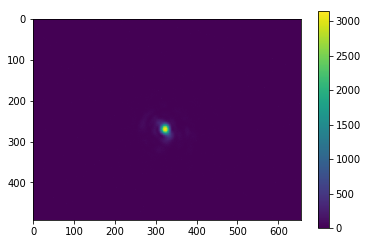

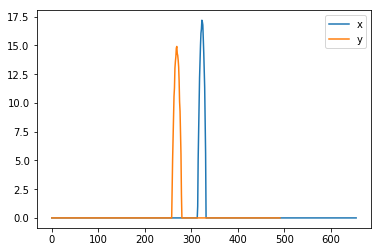

Laser file:  Shot_0228.tiff
Maximum Coordinate (pixel nos):  [333, 267]


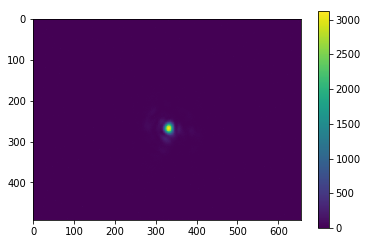

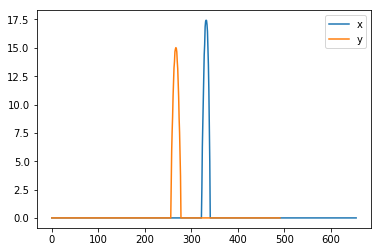

Laser file:  Shot_0209.tiff
Maximum Coordinate (pixel nos):  [328, 265]


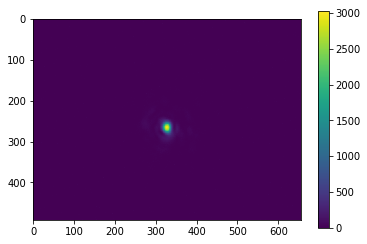

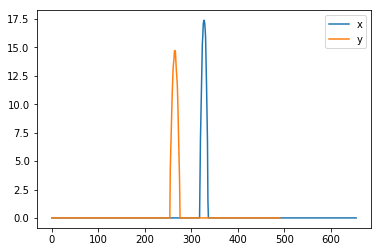

Laser file:  Shot_0196.tiff
Maximum Coordinate (pixel nos):  [323, 266]


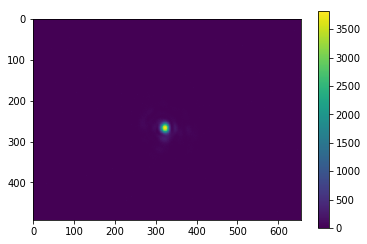

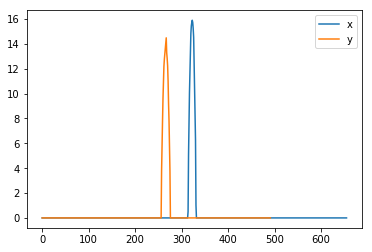

Laser file:  Shot_0219.tiff
Maximum Coordinate (pixel nos):  [332, 266]


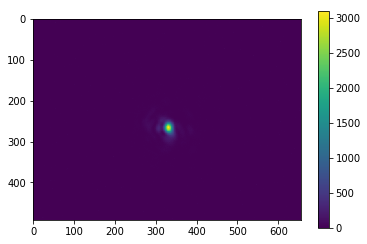

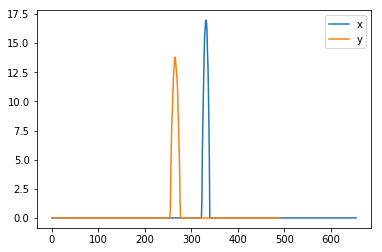

Laser file:  Shot_0220.tiff
Maximum Coordinate (pixel nos):  [318, 262]


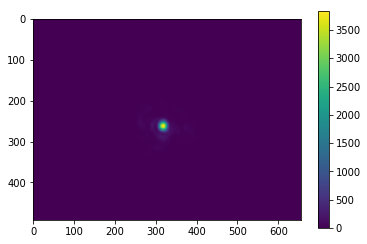

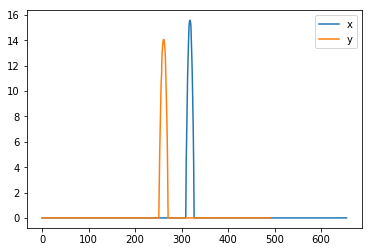

Laser file:  Shot_0204.tiff
Maximum Coordinate (pixel nos):  [328, 261]


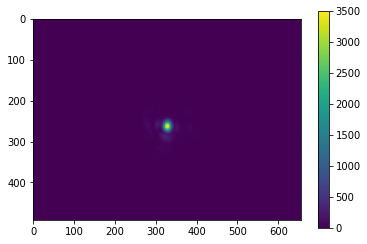

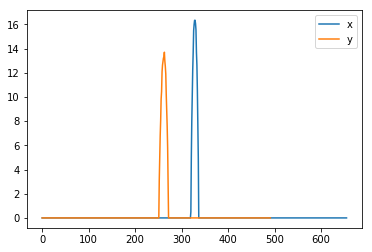

Laser file:  Shot_0224.tiff
Maximum Coordinate (pixel nos):  [327, 267]


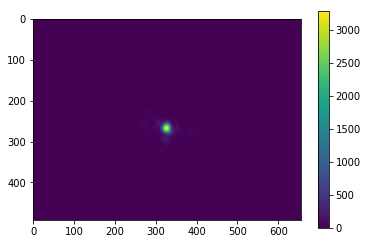

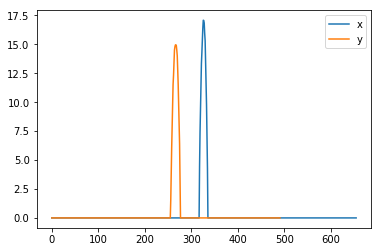

Laser file:  Shot_0194.tiff
Maximum Coordinate (pixel nos):  [323, 266]


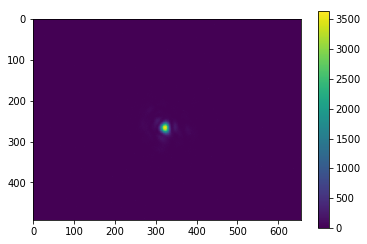

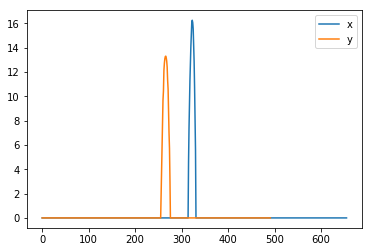

Laser file:  Shot_0217.tiff
Maximum Coordinate (pixel nos):  [335, 264]


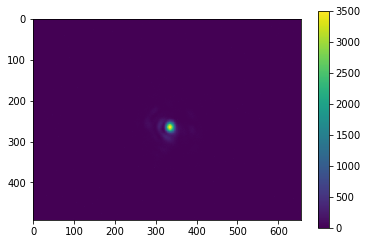

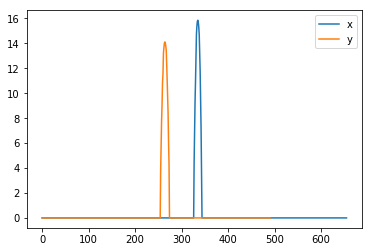

Laser file:  Shot_0193.tiff
Maximum Coordinate (pixel nos):  [323, 265]


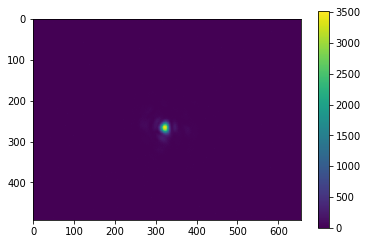

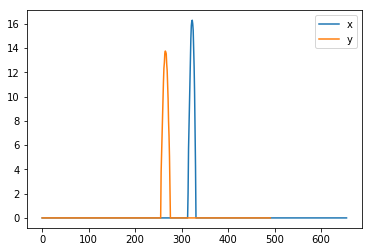

Laser file:  Shot_0212.tiff
Maximum Coordinate (pixel nos):  [326, 268]


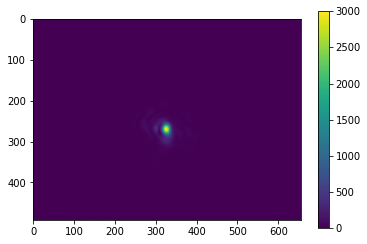

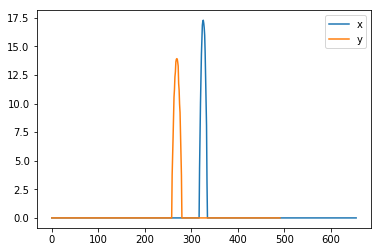

In [19]:

data_accumulative = []
for l in laserFiles:
    print ("Laser file: ", l)
    im = np.array(Image.open(folderPath + laserShots + l))
    fs = focal_spot(im, backgroundImage = background_aveImage)
    if False:
        # Plot some stuff
        # fs.createPlotWithLineOuts(umPerPixel = pixelSize * 1e6)
        fs.plot_scaledImage(umPerPixel = pixelSize * 1e6)   
    fs.calcVals(umPerPixel = pixelSize * 1e6)
    data = fs.valArray(umPerPixel = pixelSize * 1e6)
    # print ("x, y, ave, ratio of energy in spot to out")
    # print (data) 
    data_accumulative.append([data[2], data[3], fs.return_energy()])

# print ("ave, ratio of energy in spot to out, energysum")
# print (data_accumulative)
data_accumulative = np.array(data_accumulative)
ave_size = np.average(data_accumulative[:,0])
ave_ratioEnergyInSpot= np.average(data_accumulative[:,1])
ave_energy = np.average(data_accumulative[:,2])

In [20]:
aveBackgroundCount = np.average(background_sums)
print ("\n\nAverage FWHM (um)\t", ave_size, 
       "\nAve Energy in spot ratio\t", ave_ratioEnergyInSpot, 
       "\nAverage count (energy) in image\t", ave_energy - aveBackgroundCount)



Average FWHM (um)	 19.031897045711716 
Ave Energy in spot ratio	 0.2054819744071967 
Average count (energy) in image	 3017051.684397163


Laser file:  Shot_0174.tiff


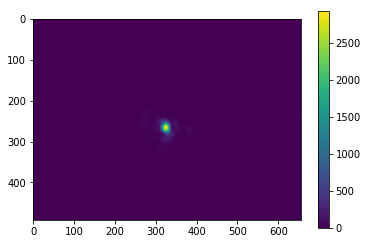

Peak Intensity 9.163851116675459e+21
Laser file:  Shot_0186.tiff


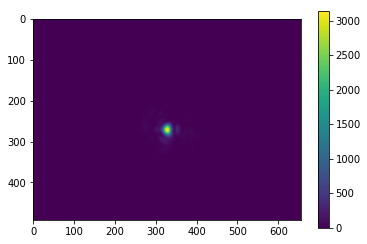

Peak Intensity 9.205513060037981e+21
Laser file:  Shot_0227.tiff


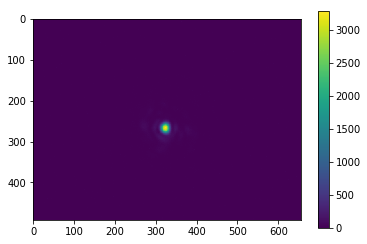

Peak Intensity 9.980460547993927e+21
Laser file:  Shot_0180.tiff


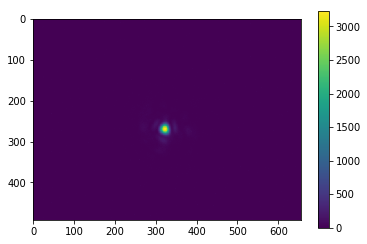

Peak Intensity 9.69782542536897e+21
Laser file:  Shot_0165.tiff


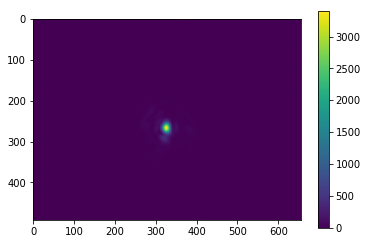

Peak Intensity 9.716973291226182e+21
Laser file:  Shot_0188.tiff


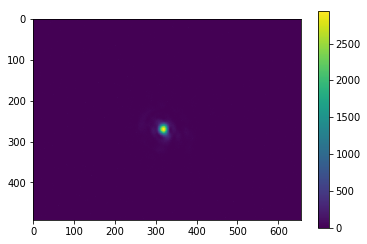

Peak Intensity 9.48174444334214e+21
Laser file:  Shot_0214.tiff


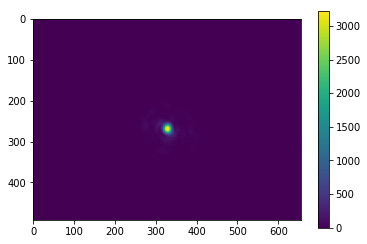

Peak Intensity 9.344546848537485e+21
Laser file:  Shot_0181.tiff


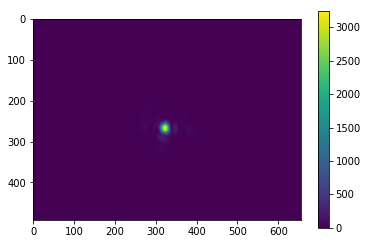

Peak Intensity 9.759111459726806e+21
Laser file:  Shot_0221.tiff


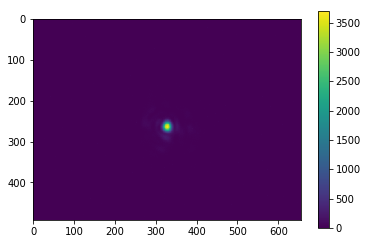

Peak Intensity 1.0216848696091091e+22
Laser file:  Shot_0216.tiff


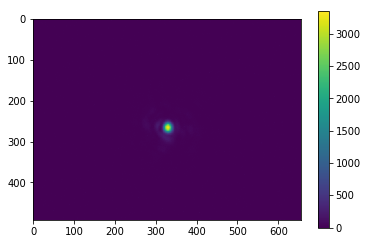

Peak Intensity 9.772717149730487e+21
Laser file:  Shot_0182.tiff


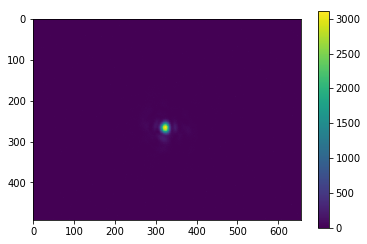

Peak Intensity 9.920255220515342e+21
Laser file:  Shot_0187.tiff


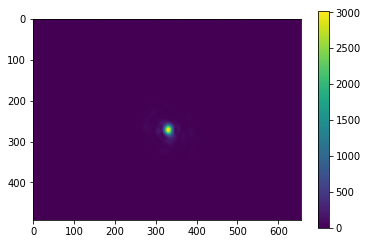

Peak Intensity 9.339367471739574e+21
Laser file:  Shot_0215.tiff


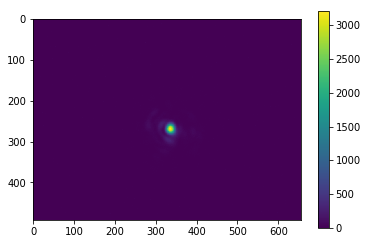

Peak Intensity 9.076260677427984e+21
Laser file:  Shot_0172.tiff


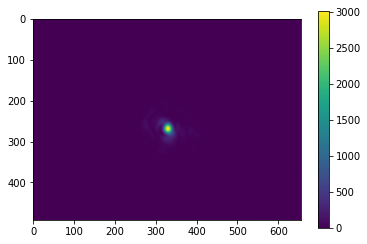

Peak Intensity 8.544277902872904e+21
Laser file:  Shot_0189.tiff


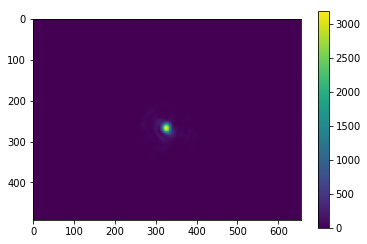

Peak Intensity 9.267882503254474e+21
Laser file:  Shot_0173.tiff


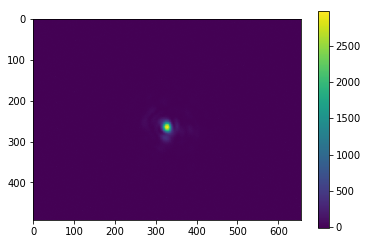

Peak Intensity 8.897959270524134e+21
Laser file:  Shot_0200.tiff


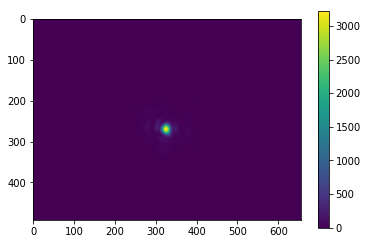

Peak Intensity 9.615242994314025e+21
Laser file:  Shot_0183.tiff


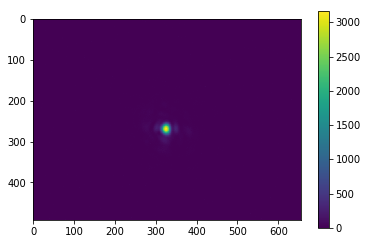

Peak Intensity 9.463696088937573e+21
Laser file:  Shot_0199.tiff


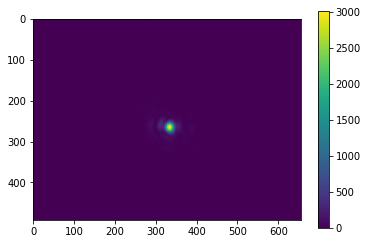

Peak Intensity 9.204900924556918e+21
Laser file:  Shot_0198.tiff


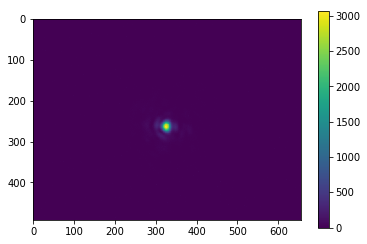

Peak Intensity 9.054510759946155e+21
Laser file:  Shot_0177.tiff


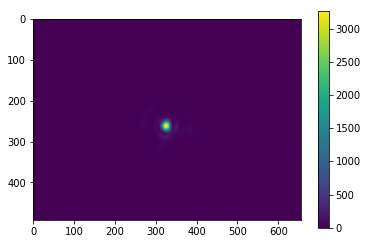

Peak Intensity 9.644401879956557e+21
Laser file:  Shot_0170.tiff


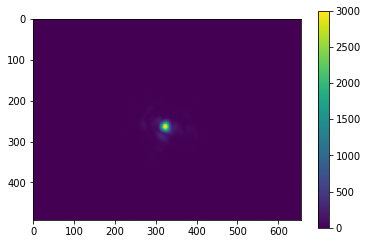

Peak Intensity 8.802586104830717e+21
Laser file:  Shot_0192.tiff


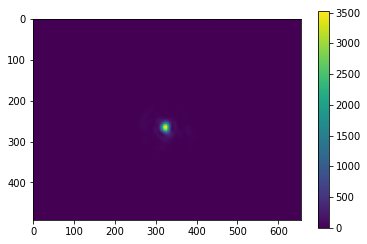

Peak Intensity 1.0211984958701254e+22
Laser file:  Shot_0211.tiff


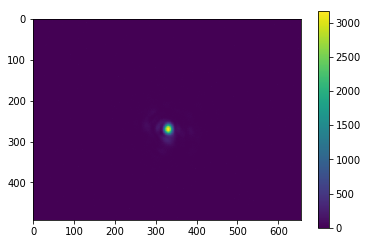

Peak Intensity 9.379204245809013e+21
Laser file:  Shot_0203.tiff


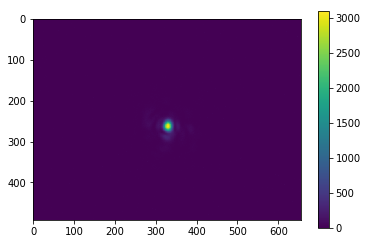

Peak Intensity 9.257065529949837e+21
Laser file:  Shot_0179.tiff


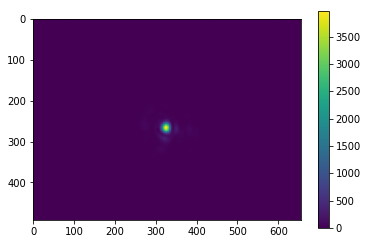

Peak Intensity 1.0656440179554198e+22
Laser file:  Shot_0226.tiff


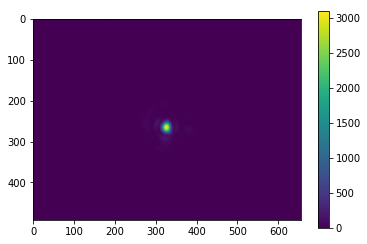

Peak Intensity 1.0154086953367496e+22
Laser file:  Shot_0185.tiff


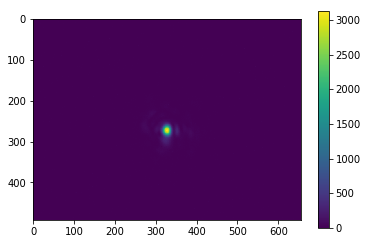

Peak Intensity 9.128769461703568e+21
Laser file:  Shot_0168.tiff


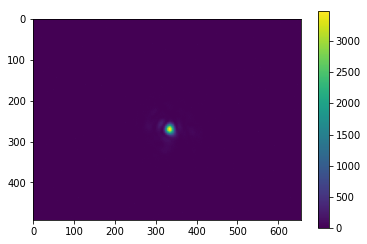

Peak Intensity 1.047157202240611e+22
Laser file:  Shot_0222.tiff


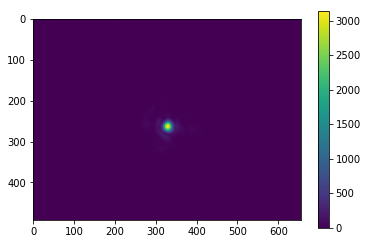

Peak Intensity 9.32820030097028e+21
Laser file:  Shot_0207.tiff


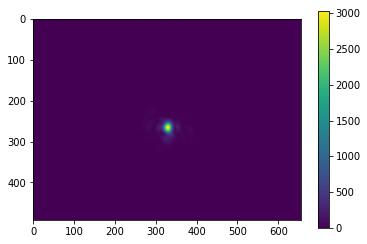

Peak Intensity 8.964236944996845e+21
Laser file:  Shot_0225.tiff


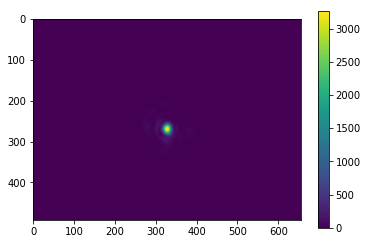

Peak Intensity 9.744929866949557e+21
Laser file:  Shot_0218.tiff


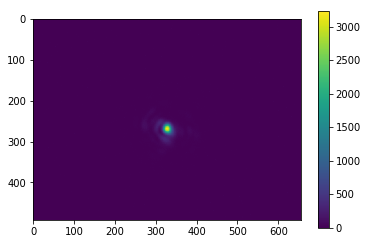

Peak Intensity 8.820369560320389e+21
Laser file:  Shot_0171.tiff


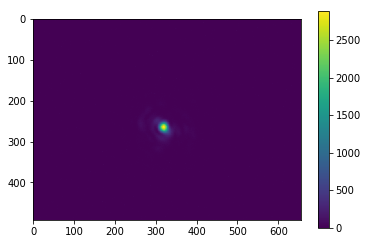

Peak Intensity 8.816300344972118e+21
Laser file:  Shot_0169.tiff


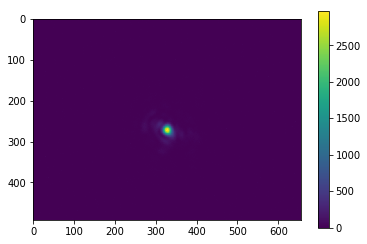

Peak Intensity 8.882039145038843e+21
Laser file:  Shot_0190.tiff


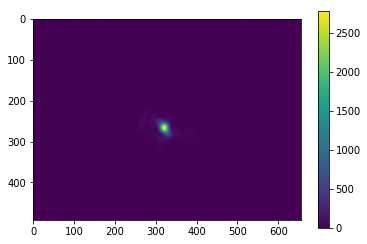

Peak Intensity 8.721980401279032e+21
Laser file:  Shot_0178.tiff


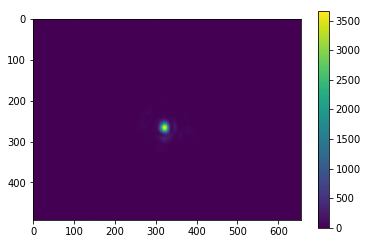

Peak Intensity 1.0299361182562625e+22
Laser file:  Shot_0195.tiff


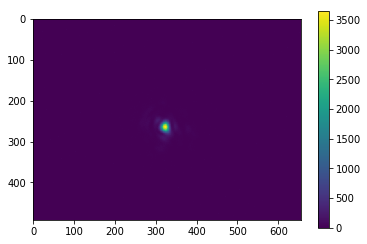

Peak Intensity 1.0174424150709205e+22
Laser file:  Shot_0208.tiff


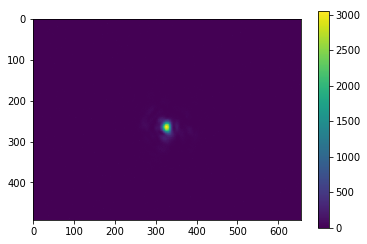

Peak Intensity 8.783460563849336e+21
Laser file:  Shot_0167.tiff


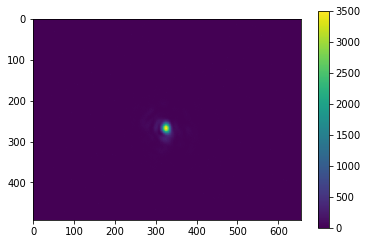

Peak Intensity 9.782606434209905e+21
Laser file:  Shot_0230.tiff


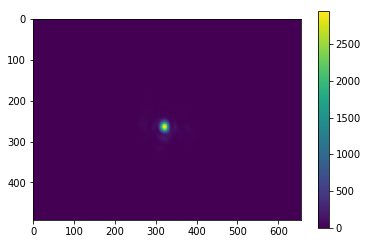

Peak Intensity 1.0177847963570663e+22
Laser file:  Shot_0202.tiff


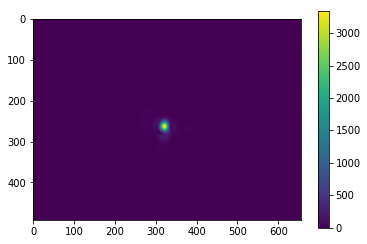

Peak Intensity 1.032972692397627e+22
Laser file:  Shot_0205.tiff


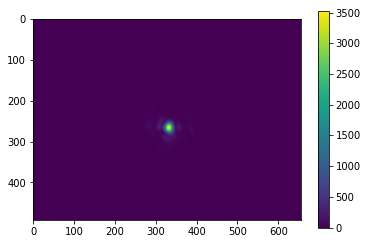

Peak Intensity 9.877419882416995e+21
Laser file:  Shot_0201.tiff


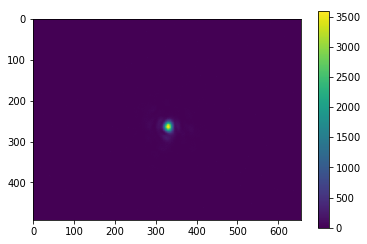

Peak Intensity 1.0601817816034479e+22
Laser file:  Shot_0184.tiff


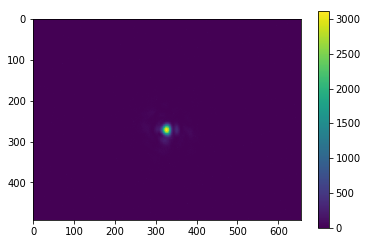

Peak Intensity 9.510485888096134e+21
Laser file:  Shot_0166.tiff


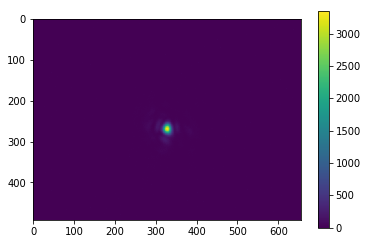

Peak Intensity 1.0433252571202667e+22
Laser file:  Shot_0175.tiff


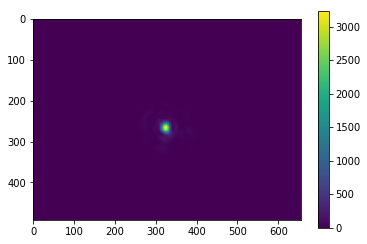

Peak Intensity 9.621982419458575e+21
Laser file:  Shot_0229.tiff


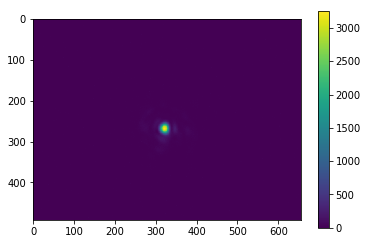

Peak Intensity 9.693306821119725e+21
Laser file:  Shot_0213.tiff


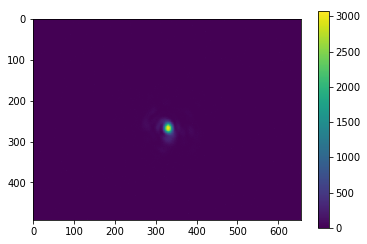

Peak Intensity 8.899630959915199e+21
Laser file:  Shot_0223.tiff


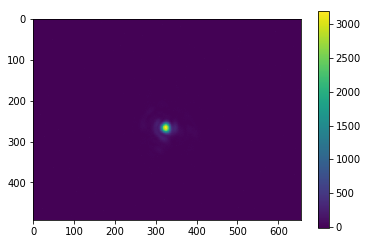

Peak Intensity 8.914091176945786e+21
Laser file:  Shot_0176.tiff


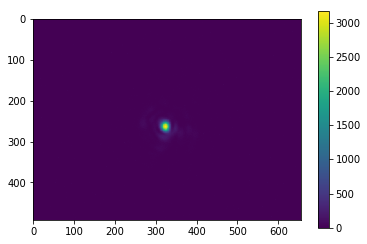

Peak Intensity 9.444756486255874e+21
Laser file:  Shot_0210.tiff


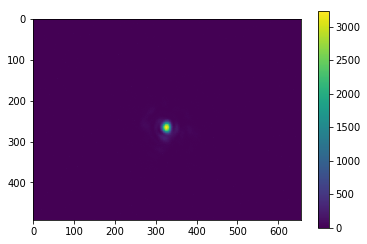

Peak Intensity 9.639923762182847e+21
Laser file:  Shot_0197.tiff


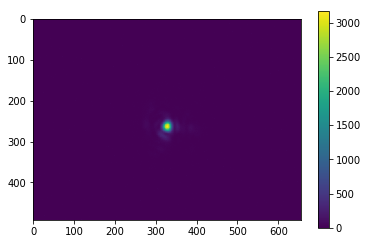

Peak Intensity 9.18570060720842e+21
Laser file:  Shot_0206.tiff


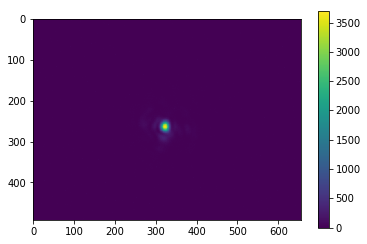

Peak Intensity 1.0022137144140515e+22
Laser file:  Shot_0191.tiff


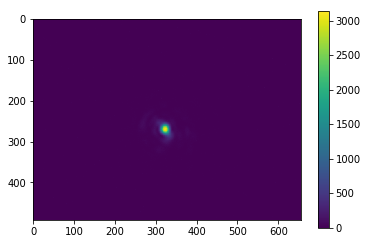

Peak Intensity 9.007835448491814e+21
Laser file:  Shot_0228.tiff


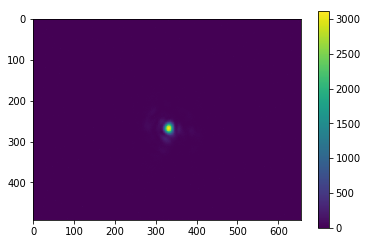

Peak Intensity 9.414236849754318e+21
Laser file:  Shot_0209.tiff


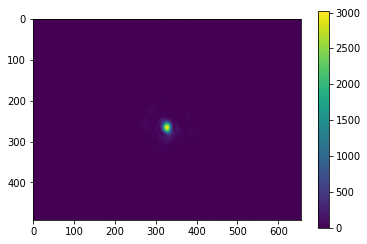

Peak Intensity 9.367422620843312e+21
Laser file:  Shot_0196.tiff


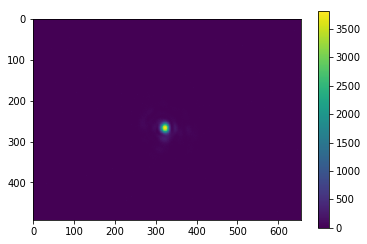

Peak Intensity 1.0390157705540708e+22
Laser file:  Shot_0219.tiff


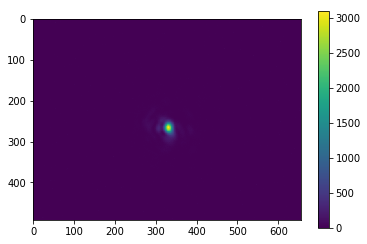

Peak Intensity 9.020632423130904e+21
Laser file:  Shot_0220.tiff


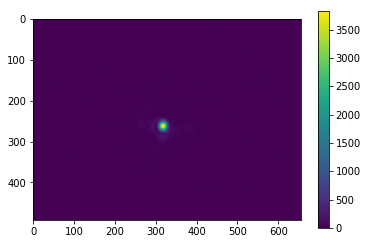

Peak Intensity 1.048253285670207e+22
Laser file:  Shot_0204.tiff


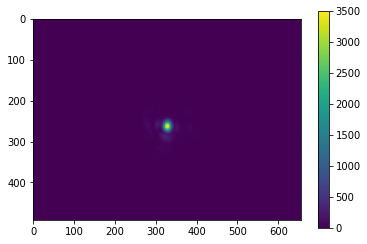

Peak Intensity 1.003787370827569e+22
Laser file:  Shot_0224.tiff


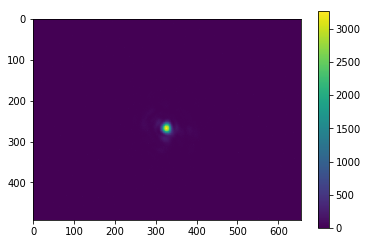

Peak Intensity 9.728375072158353e+21
Laser file:  Shot_0194.tiff


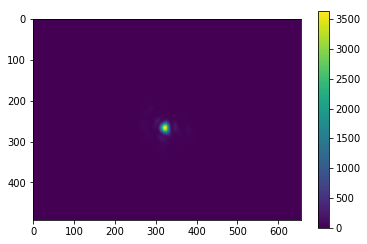

Peak Intensity 1.0589721970095774e+22
Laser file:  Shot_0217.tiff


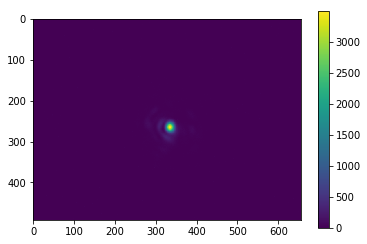

Peak Intensity 9.412786288412161e+21
Laser file:  Shot_0193.tiff


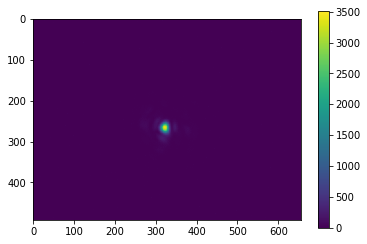

Peak Intensity 1.031505402626436e+22
Laser file:  Shot_0212.tiff


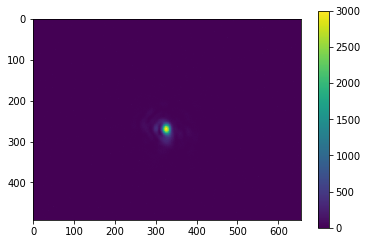

Peak Intensity 8.18107179784126e+21


Average peak intensity 9.561329504166535e+21


In [22]:
# Working out the peak intensity

intensity_list = []
for l in laserFiles[:]:
    print ("Laser file: ", l)
    im = np.array(Image.open(folderPath + laserShots + l))
    fs = focal_spot(im, backgroundImage = background_aveImage, calculations = False)

    I = fs.im
    dx = pixelSize
    peakPowerTW_per_j = 4.92
    I = I / np.sum(I) / (dx * dx) * peakPowerTW_per_j
    if False:
        plt.imshow(I)
        plt.colorbar()
        plt.show()
    print ("Peak Intensity", I.max() * 1e12)
    intensity_list.append(I.max() * 1e12)
    
print ("\n\nAverage peak intensity", np.average(intensity_list) )
